### Overview
#### The purpose of this notebook is to provide an overview of our project
The structure of this project is as follows:

* app_train.py and app_pretrain.py were used to perform wandb sweeps executing our experiments. The corresponding .ipynbs were used for prototyping.

* Several colab notebooks are outdated, but can theoretically still be useful if anyone wants to port this to colab. We cannot provide any of the datasets however, they must be included using a personal google drive.

* The folder /asset contains models, losses, data augmentations helpers, the trainers and datasets, together with many utility function, in separate files. Most of these are not very interesting if you are familiar with our solutions for the preceeding lab tasks, but asset/models.py is of course very important, and somewhat documented.

* Model training histories and parameters are in /trainer_logs and /models, but can also be accessed for each run of our experiments in our WandB projects, which we recommend exploring instead.

* The way we design the dataset class is explained in disparity_datasets.ipynb, and Scene Flow, KITTI and Cityscapes can be explored in dataset_sandbox.ipynb.

* There is also a Fix_Sky.ipynb with an attempt to aleviate the issue with arbitrary sky values in Kitti. This didn't work so well, as our bandaid solution to telling apart invalid and true zero disparity values when samples from Kitti and Scene Flow are mixed is kind of hacky, we didn't feel comfortable putting this into the final report. This would probably take one or two days of testing and some days of training to get right.

* Further files which are not mentioned here are probably also not relevant.
#### Import all the stuff we need, set up wandb

In [1]:
# WandB setup first
import sys
import os
import wandb
import torch
import warnings
from asset.utils import *
import torchvision.transforms as transforms
from torch.utils.data import ConcatDataset
from asset.transforms import DisparityTransformCompose, DisparityTransform, RandomCrop, Interpolate
from asset.datasets import DisparityDataset
from asset.criterion import NonZeroWrapper, IntermediateSupervisionWrapper, PE
from asset.model import BaselineModel, CustomModel
from asset.trainer import Trainer, TrainerBaseline
from torch.cuda.amp import autocast
from asset.transforms import DisparityTransformCompose, DisparityTransform, RandomCrop, Interpolate, CutMix
import torch.nn.functional as F

if not sys.warnoptions:
    warnings.simplefilter("ignore", category=UserWarning)

            
os.environ['WANDB_MODE'] = 'dryrun' #uncomment to prevent wandb logging - 'offline mode'

hyperparameter_defaults = dict(
    encoder_depth= 4,
    encoder_backbone='efficientnet-b3', #mobilenet_v2
    height_train=256,
    width_train=512,
    height_valid=368,
    width_valid=1248,
    n_epochs=1000,
    patience=12,
    batch_size_train=8,
    batch_size_valid=1,
    lr=1e-3,
    lr_decay=0.992,
    pretrained=True, #False
    augment_data=True #False
)

wandb.init(config=hyperparameter_defaults, project="CudaLab_SS21_Pretraining")
print("Python Version:", sys.version)
print("PyTorch Version:", torch.__version__)
print("Cuda Version:", torch.version.cuda)
print("CUDNN Version:", torch.backends.cudnn.version())

config=wandb.config

pretrained_title = config.encoder_backbone + f'_encoder_depth_{config.encoder_depth}'+'_pretrained'
pretrained_title_baseline = 'baseline_model_pretrained'
pretrain_str = '_pretrain' if config.pretrained else '_nopretrain'
augment_str = '_augment' if config.augment_data else '_noaugment'
experiment_title = config.encoder_backbone + pretrain_str + augment_str #+ '_eval'
experiment_title_baseline = 'baseline_model' + pretrain_str + augment_str
print('Experiment title:', experiment_title)
pretty_print(config)

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: W&B syncing is set to `offline` in this directory.  Run `wandb online` or set WANDB_MODE=online to enable cloud syncing.


Python Version: 3.7.9 (default, Aug 31 2020, 12:42:55) 
[GCC 7.3.0]
PyTorch Version: 1.8.1
Cuda Version: 11.1
CUDNN Version: 8005
Experiment title: efficientnet-b3_pretrain_augment
  encoder_depth                4
  encoder_backbone             efficientnet-b3
  height_train                 256
  width_train                  512
  height_valid                 368
  width_valid                  1248
  n_epochs                     1000
  patience                     12
  batch_size_train             8
  batch_size_valid             1
  lr                           0.001
  lr_decay                     0.992
  pretrained                   True
  augment_data                 True


#### Define all criteria

In [2]:
criterion_smoothl1 = torch.nn.SmoothL1Loss(reduction='mean', beta=1.0)
wrapped_criterion_smoothl1 = NonZeroWrapper(torch.nn.SmoothL1Loss(reduction='none', beta=1.0), max_disp=192)
wrapped_criterion_smoothl1 = IntermediateSupervisionWrapper(wrapped_criterion_smoothl1)
wrapped_criterion_1PE = NonZeroWrapper(PE(reduction='none', threshold=1))
wrapped_criterion_3PE = NonZeroWrapper(PE(reduction='none'))
wrapped_criterion_5PE = NonZeroWrapper(PE(reduction='none', threshold=5))
metrics = {
  "1PE": wrapped_criterion_1PE,
  "3PE": wrapped_criterion_3PE,
  "5PE": wrapped_criterion_5PE
}

### Pretraining
#### Load Data

In [3]:
# Sceneflow - Load downsampled and full resolution datasets
## Subdatasets are loaded individually and then concatenated
height_warmup, width_warmup = 512, 928
height, width = 528, 944
transform_warmup = DisparityTransformCompose([DisparityTransform(transforms.Normalize(mean_imagenet, std_imagenet), apply_to_disparity=False),
                                              RandomCrop(output_size=(height_warmup,width_warmup)),
                                              Interpolate(scale_factor=0.5)])

transform = DisparityTransformCompose([DisparityTransform(transforms.Normalize(mean_imagenet, std_imagenet), apply_to_disparity=False),
                                       RandomCrop(output_size=(height,width))])

monkaa_dataset_warmup = DisparityDataset(get_left_frames_monkaa(), left_to_right_monkaa, left_to_disparity_monkaa, load_image_sceneflow, load_disparity_sceneflow, transform_warmup)
driving_dataset_warmup = DisparityDataset(get_left_frames_driving(), left_to_right_driving, left_to_disparity_driving, load_image_sceneflow, load_disparity_sceneflow, transform_warmup)
flyingthings3d_dataset_warmup = DisparityDataset(get_left_frames_flyingthings3d(use_difficult_examples=False), left_to_right_flyingthings3d, left_to_disparity_flyingthings3d, load_image_sceneflow, load_disparity_sceneflow, transform_warmup)
concat_dataset_warmup = ConcatDataset([monkaa_dataset_warmup, driving_dataset_warmup, flyingthings3d_dataset_warmup])


monkaa_dataset = DisparityDataset(get_left_frames_monkaa(), left_to_right_monkaa, left_to_disparity_monkaa, load_image_sceneflow, load_disparity_sceneflow, transform)
driving_dataset = DisparityDataset(get_left_frames_driving(), left_to_right_driving, left_to_disparity_driving, load_image_sceneflow, load_disparity_sceneflow, transform)
flyingthings3d_dataset = DisparityDataset(get_left_frames_flyingthings3d(use_difficult_examples=False), left_to_right_flyingthings3d, left_to_disparity_flyingthings3d, load_image_sceneflow, load_disparity_sceneflow, transform)
print('Number of samples in the Monkaa dataset:', len(monkaa_dataset))
print('Number of samples in the Driving dataset:', len(driving_dataset))
print('Number of samples in the Flyingthings3d dataset:', len(flyingthings3d_dataset))
concat_dataset = ConcatDataset([monkaa_dataset, driving_dataset, flyingthings3d_dataset])
print('Number of samples in the concatenated Sceneflow dataset:', len(concat_dataset))

Number of samples in the Monkaa dataset: 8664
Number of samples in the Driving dataset: 4400
Number of samples in the Flyingthings3d dataset: 26066
Number of samples in the concatenated Sceneflow dataset: 39130


#### Show some samples from the warm-up data

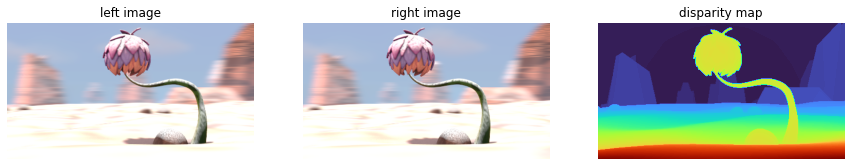

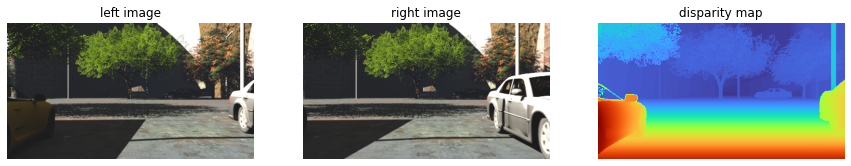

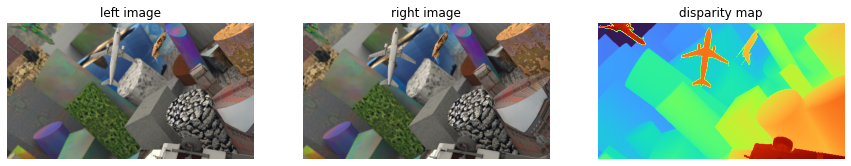

In [4]:
#rand_idx = np.random.choice(np.arange(len(concat_dataset_warmup)), size=3, replace=False)
rand_idx = [1871, 12612, 31972]
for i in rand_idx:
    (img_left, img_right), img_disparity = concat_dataset_warmup[i]
    
    _, axes = plt.subplots(1, 3, figsize=(15, 5))
    show_image(inv_normalize(img_left), ax=axes[0], title='left image')
    
    show_image(inv_normalize(img_right), ax=axes[1], title='right image')
    
    show_disparity(img_disparity, ax=axes[2], title='disparity map')

    plt.show()

#### Show some samples from the data at full resolution

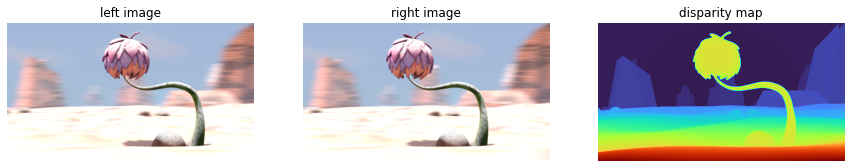

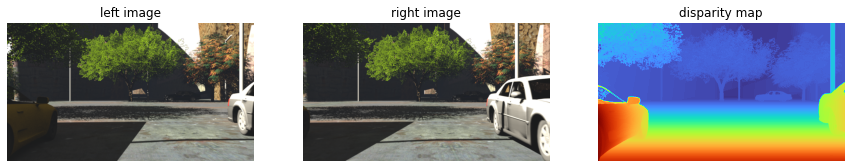

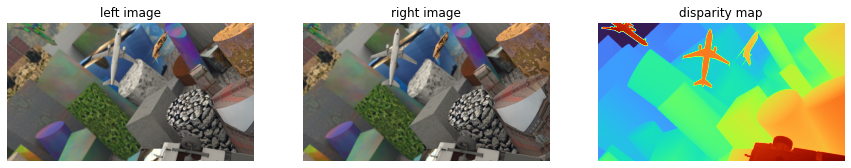

In [5]:
for i in rand_idx:
    (img_left, img_right), img_disparity = concat_dataset[i]
    
    _, axes = plt.subplots(1, 3, figsize=(15, 5))
    show_image(inv_normalize(img_left), ax=axes[0], title='left image')
    
    show_image(inv_normalize(img_right), ax=axes[1], title='right image')
    
    show_disparity(img_disparity, ax=axes[2], title='disparity map')

    plt.show()

#### Create Dataloaders for training and validation splits
Splitting the data is based on random seed which is equivalent to the one used in all our experiments.

In [6]:
train_share_concat = 0.8
N_samples_concat = len(concat_dataset)
indices_concat = list(range(N_samples_concat))
split_concat = int(np.ceil(train_share_concat * N_samples_concat))
np.random.seed(42)
np.random.shuffle(indices_concat)

BATCHSIZE_CONCAT_WARMUP, BATCHSIZE_CONCAT_VALID_WARMUP = 8, 32
BATCHSIZE_CONCAT, BATCHSIZE_CONCAT_VALID = 2, 8

train_idx_concat, valid_idx_concat = indices_concat[:split_concat], indices_concat[split_concat:]
print('Number of training : validation samples -', len(train_idx_concat), ':', len(valid_idx_concat))

trainset_concat_warmup = torch.utils.data.Subset(concat_dataset_warmup, train_idx_concat)
validset_concat_warmup = torch.utils.data.Subset(concat_dataset_warmup, valid_idx_concat)

trainset_concat = torch.utils.data.Subset(concat_dataset, train_idx_concat)
validset_concat = torch.utils.data.Subset(concat_dataset, valid_idx_concat)

trainloader_concat_warmup = torch.utils.data.DataLoader(trainset_concat_warmup, batch_size=BATCHSIZE_CONCAT_WARMUP, shuffle=True, num_workers=10)
validloader_concat_warmup = torch.utils.data.DataLoader(validset_concat_warmup, batch_size=BATCHSIZE_CONCAT_VALID_WARMUP, shuffle=False, num_workers=10)

trainloader_concat = torch.utils.data.DataLoader(trainset_concat, batch_size=BATCHSIZE_CONCAT, shuffle=True, num_workers=10)
validloader_concat = torch.utils.data.DataLoader(validset_concat, batch_size=BATCHSIZE_CONCAT_VALID, shuffle=False, num_workers=10)

Number of training : validation samples - 31304 : 7826


#### Load Pretrained Model

In [7]:
model_dummy = CustomModel(encoder_depth=config.encoder_depth, backbone=config.encoder_backbone)
model_dummy_baseline = BaselineModel()
print('Loading pretrained model!')
title = pretrained_title_baseline
pretrain_loader_baseline = TrainerBaseline(model_dummy_baseline, wrapped_criterion_smoothl1, trainloader_concat, validloader_concat, eval_metrics=metrics, es_mode='min', description=title, patience=32, lr=config.lr, n_epochs=config.n_epochs, lr_decay=config.lr_decay)
title = pretrained_title
pretrain_loader = Trainer(model_dummy, wrapped_criterion_smoothl1, trainloader_concat, validloader_concat, eval_metrics=metrics, es_mode='min', description=title, patience=32, lr=config.lr, n_epochs=config.n_epochs, lr_decay=config.lr_decay)
pretrain_loader.load_model()
pretrain_loader_baseline.load_model()
model_pretrained = pretrain_loader.model
model_pretrained.eval()
model_pretrained_baseline = pretrain_loader_baseline.model
model_pretrained_baseline.eval()

n_params = count_parameters(model_pretrained)
n_params_ff = count_parameters(model_pretrained.features)
n_params_sh = count_parameters(model_pretrained.stacked_hourglass)
#wandb.run.summary['Parameter Number'] = n_params
print(f'The model has {n_params} trainable parameters.')
print(f'The feature fusion has {n_params_ff} trainable parameters.')
print(f'The stacked hourglass has {n_params_sh} trainable parameters.')

Loading pretrained model!
The model has 16687768 trainable parameters.
The feature fusion has 12685896 trainable parameters.
The stacked hourglass has 1885216 trainable parameters.


In [8]:
# history = pretrain_loader.history
# best_ind = np.array(history['valid loss']).argmin()
# for key in ['valid loss', '3PE', '5PE', '1PE']:
#     print('Best model '+key+':', history[key][best_ind])

#### Show some results from Scene Flow

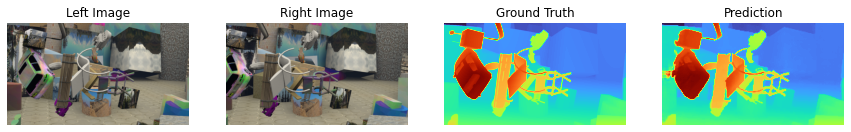

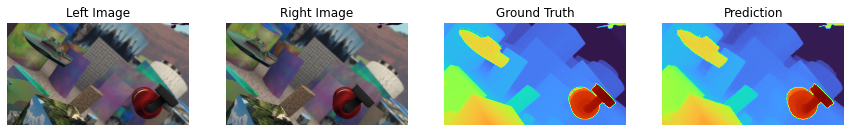

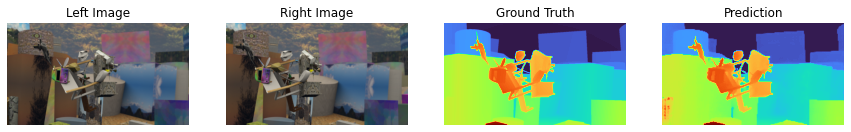

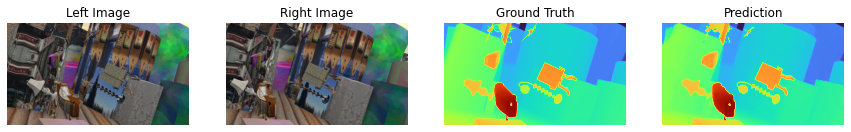

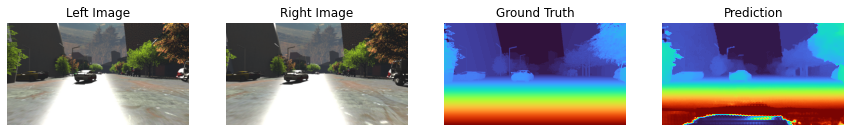

...

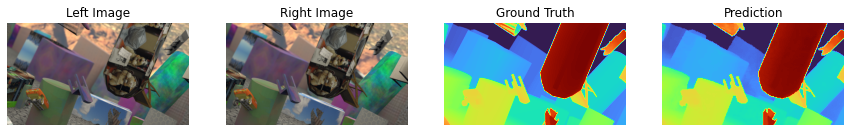

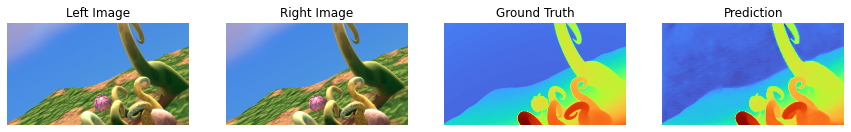

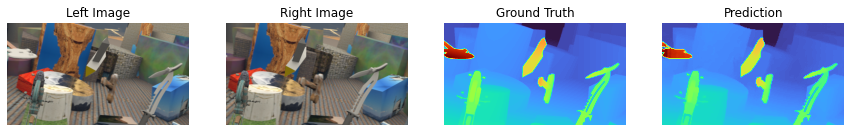

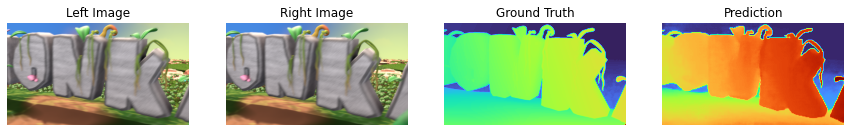

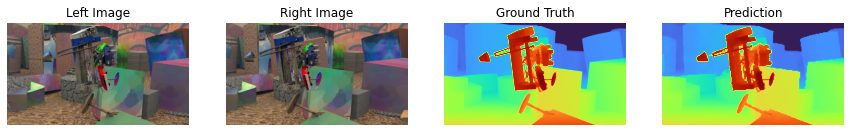

In [9]:
dataloader_iterator = iter(validloader_concat)

rand_idx = np.random.choice(np.arange(len(validset_concat)), size=25, replace=False)
#rand_idx = [5928]
for i in rand_idx:
    (img_left, img_right), target = validset_concat[i]
    with torch.no_grad():
        with autocast():
            net_out = model_pretrained(img_left.unsqueeze(0).cuda(), img_right.unsqueeze(0).cuda()) 

    _, axes = plt.subplots(1, 4, figsize=(15, 5))
    show_image(inv_normalize(img_left), ax=axes[0], title='Left Image')

    show_image(inv_normalize(img_right), ax=axes[1], title='Right Image')

    show_disparity(target, ax=axes[2], title='Ground Truth')

    show_disparity(net_out.squeeze(0).cpu().float(), ax=axes[3], title='Prediction')

    plt.show()
    
    
#     _, ax = plt.subplots(1, 1, figsize=(4, 5))
#     show_image(inv_normalize(img_left), ax=ax, title='Left Image')
#     ax.set_title(None)
#     plt.show()
    
#     _, ax = plt.subplots(1, 1, figsize=(4, 5))
#     show_image(inv_normalize(img_right), ax=ax, title='Right Image')
#     ax.set_title(None)
#     plt.show()
    
#     _, ax = plt.subplots(1, 1, figsize=(4, 5))
#     show_disparity(target, ax=ax, title='Ground Truth')
#     ax.set_title(None)
#     plt.show()
    
#     _, ax = plt.subplots(1, 1, figsize=(4, 5))
#     show_disparity(net_out.squeeze(0).cpu().float(), ax=ax, title='Prediction')
#     ax.set_title(None)
#     plt.show()

### Training
#### Load Data and create dataloaders

In [10]:
MEAN, STD = [0.485, 0.456, 0.406], [0.229, 0.224, 0.225]

transform = DisparityTransformCompose([DisparityTransform(transforms.Normalize(MEAN, STD), apply_to_disparity=False),
                                       RandomCrop(output_size=(config.height_train,config.width_train))])


# transform_large = DisparityTransformCompose([DisparityTransform(transforms.Normalize(MEAN, STD), apply_to_disparity=False),
#                                        RandomCrop(output_size=(352,1216))])

transform_large = DisparityTransformCompose([DisparityTransform(transforms.Normalize(MEAN, STD), apply_to_disparity=False)])

inv_normalize = transforms.Normalize(
   mean= [-m/s for m, s in zip(MEAN, STD)],
   std= [1/s for s in STD]
)


kitti_dataset = DisparityDataset(get_left_frames_kitti(), left_to_right_kitti, left_to_disparity_kitti, load_image_kitti, load_disparity_kitti, transform)
kitti_dataset_large = DisparityDataset(get_left_frames_kitti(), left_to_right_kitti, left_to_disparity_kitti, load_image_kitti, load_disparity_kitti, transform_large)
print('Number of samples in the KITTI dataset:', len(kitti_dataset))

train_share = 0.75
N_samples = len(kitti_dataset)
#N_samples = 40 ### REMOVE THIS LINE AFTER DEBUGGING!!!
indices = list(range(N_samples))
split = int(np.ceil(train_share * N_samples))
np.random.seed(42)
np.random.shuffle(indices)

train_idx, valid_idx = indices[:split], indices[split:]
print('Number of training : validation samples -', len(train_idx), ':', len(valid_idx))
trainset = torch.utils.data.Subset(kitti_dataset, train_idx)
validset = torch.utils.data.Subset(kitti_dataset_large, valid_idx)

if config.augment_data:
    transform = DisparityTransformCompose([transform,
                                       CutMix(trainset)])
    kitti_dataset = DisparityDataset(get_left_frames_kitti(), left_to_right_kitti, left_to_disparity_kitti, load_image_kitti, load_disparity_kitti, transform)
    trainset = torch.utils.data.Subset(kitti_dataset, train_idx)

trainloader = torch.utils.data.DataLoader(trainset, batch_size=config.batch_size_train, shuffle=True, num_workers=10)
validloader = torch.utils.data.DataLoader(validset, batch_size=config.batch_size_valid, shuffle=False, num_workers=10)

Number of samples in the KITTI dataset: 200
Number of training : validation samples - 150 : 50


#### Show some samples from KITTI-2015

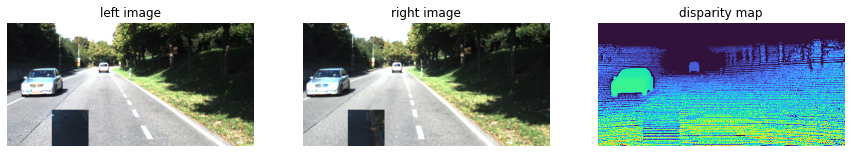

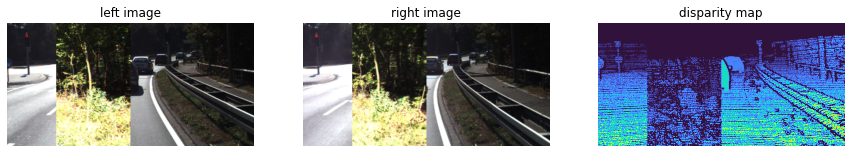

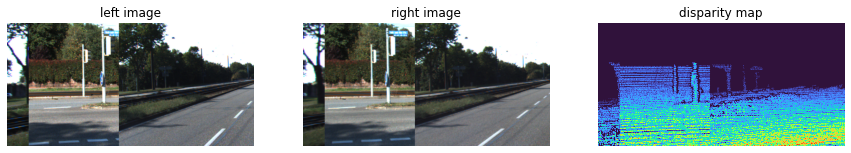

In [11]:
rand_idx = np.random.choice(np.arange(len(trainset)), size=3, replace=False)
#rand_idx = [1871, 12612, 31972]
for i in rand_idx:
    (img_left, img_right), img_disparity = trainset[i]
    
    _, axes = plt.subplots(1, 3, figsize=(15, 5))
    show_image(inv_normalize(img_left), ax=axes[0], title='left image')
    
    show_image(inv_normalize(img_right), ax=axes[1], title='right image')
    
    show_disparity(img_disparity, ax=axes[2], title='disparity map')

    plt.show()

#### Load Fine-tuned Model

In [12]:
model_dummy = CustomModel(encoder_depth=config.encoder_depth, backbone=config.encoder_backbone)
model_dummy_baseline = BaselineModel()
print('Loading fine-tuned model!')
title = experiment_title_baseline
finetune_loader_baseline = TrainerBaseline(model_dummy_baseline, wrapped_criterion_smoothl1, trainloader_concat, validloader_concat, eval_metrics=metrics, es_mode='min', description=title, patience=32, lr=config.lr, n_epochs=config.n_epochs, lr_decay=config.lr_decay)
title = experiment_title
finetune_loader = Trainer(model_dummy, wrapped_criterion_smoothl1, trainloader_concat, validloader_concat, eval_metrics=metrics, es_mode='min', description=title, patience=32, lr=config.lr, n_epochs=config.n_epochs, lr_decay=config.lr_decay)
finetune_loader.load_model()
finetune_loader_baseline.load_model()
model_finetuned = finetune_loader.model
model_finetuned.eval()
model_finetuned_baseline = finetune_loader_baseline.model
model_finetuned_baseline.eval()
print()

Loading fine-tuned model!



#### Show some results

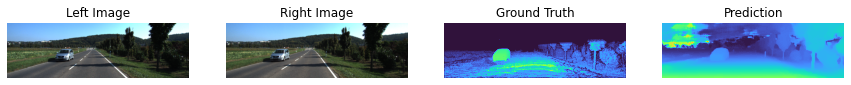

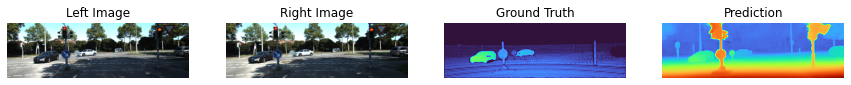

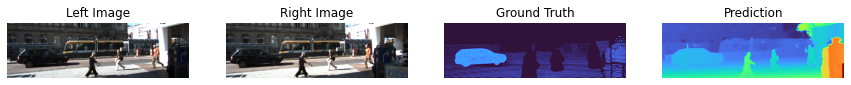

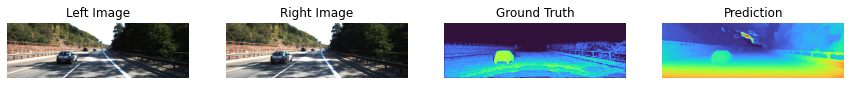

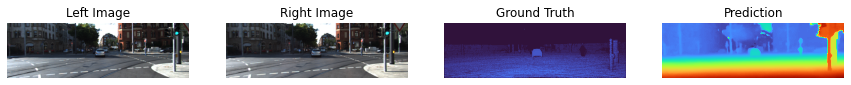

...

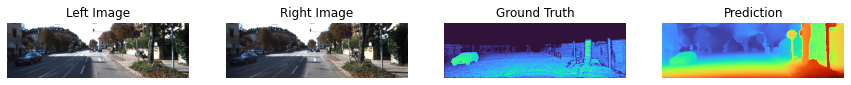

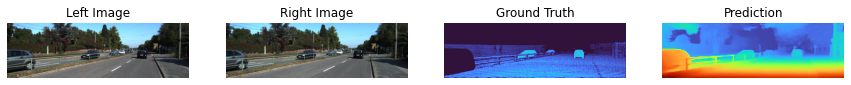

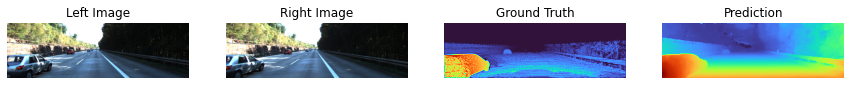

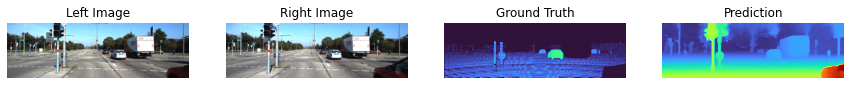

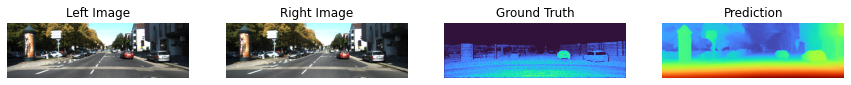

In [13]:
rand_idx = np.random.choice(np.arange(len(validset)), size=25, replace=False)
for i in rand_idx:
    (img_left, img_right), target = validset[i]
    with torch.no_grad():
        with autocast():
            img_left_interp, img_right_interp = F.interpolate(img_left.unsqueeze(0).cuda(), size=(368,1248), mode='bicubic'), F.interpolate(img_right.unsqueeze(0).cuda(), size=(368,1248), mode='bicubic')
            net_out = model_finetuned(img_left_interp, img_right_interp)
            net_out = F.interpolate(net_out, size=tuple(target.shape[-2:]), mode='bicubic')
            net_out *= target.shape[-1]/1248
            
    _, axes = plt.subplots(1, 4, figsize=(15, 5))
    show_image(inv_normalize(img_left), ax=axes[0], title='Left Image')

    show_image(inv_normalize(img_right), ax=axes[1], title='Right Image')

    show_disparity(target, ax=axes[2], title='Ground Truth')

    show_disparity(net_out.squeeze(0).cpu().float(), ax=axes[3], title='Prediction')

    plt.show()
    
    
#     _, ax = plt.subplots(1, 1, figsize=(4, 5))
#     show_image(inv_normalize(img_left), ax=ax, title='Left Image')
#     ax.set_title(None)
#     plt.show()
    
#     _, ax = plt.subplots(1, 1, figsize=(4, 5))
#     show_image(inv_normalize(img_right), ax=ax, title='Right Image')
#     ax.set_title(None)
#     plt.show()
    
#     _, ax = plt.subplots(1, 1, figsize=(4, 5))
#     show_disparity(target, ax=ax, title='Ground Truth')
#     ax.set_title(None)
#     plt.show()
    
#     _, ax = plt.subplots(1, 1, figsize=(4, 5))
#     show_disparity(net_out.squeeze(0).cpu().float(), ax=ax, title='Prediction')
#     ax.set_title(None)
#     plt.show()

#### Saliency Maps

In [14]:
from matplotlib.colors import Normalize

def show_saliency(model, roi, ind=0, dataset=validset):
    (img, img_r), target = dataset[ind]
    device = next(model.parameters()).device
    img_grad = img.clone().to(device)
    img_grad.requires_grad = True
    model.eval()
    img_grad_reshape, img_r = F.interpolate(img_grad.unsqueeze(0), size=(368,1248), mode='bicubic'), F.interpolate(img_r.to(device).unsqueeze(0), size=(368,1248), mode='bicubic')
    disp_out = model(img_grad_reshape, img_r)
    disp_out = F.interpolate(disp_out, size=tuple(target.shape[-2:]), mode='bicubic')
    disp_out *= target.shape[-1]/1248
    y, x = roi
    roi = disp_out[0,0,y,x]
    roi.backward()
    saliency = torch.mean(img_grad.grad.cpu().abs(), dim=0)
    model.train()

    circle1 = plt.Circle((x, y), 20, color='r', lw=3, fill=False)
    circle2 = plt.Circle((x, y), 20, color='r', lw=3, fill=False)

    saliency_sorted = np.sort(saliency.flatten())
    cut_ind = int(0.8 * len(saliency_sorted))
    cut_off = saliency_sorted[cut_ind]
    mask = saliency > cut_off
    saliency_masked = saliency.clone()
    saliency_masked = (saliency_masked - cut_off)/(saliency_masked.max()- cut_off)
    saliency_masked = torch.log(saliency_masked+1e-12-saliency_masked.min())
    saliency_masked[torch.logical_not(mask)] = 0.
    saliency_masked = (saliency_masked - saliency_masked.min())/(saliency_masked.max()- saliency_masked.min())
    saliency_masked[torch.logical_not(mask)] = 0.
    stacked_img = torch.cat([inv_normalize(img_grad.detach().cpu()), saliency_masked.unsqueeze(0)], 0)

    fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(25,10))
    show_image(inv_normalize(img_grad.detach().cpu()), ax1)
    ax1.add_patch(circle1)
    show_disparity(disp_out.detach().cpu(), ax2)
    ax2.add_patch(circle2)
    ax3.imshow(torch.ones_like(saliency_masked), cmap='Greys_r') #alpha= 0 -> Transparent, 1 -> Fully Covering
    ax3.imshow(stacked_img.permute(1,2,0))
    ax3.set_title('Saliency Map')
    ax3.axis('off')
    ax1.set_title(None)
    ax2.set_title(None)
    ax3.set_title(None)
    plt.show()

efficientnet-b3


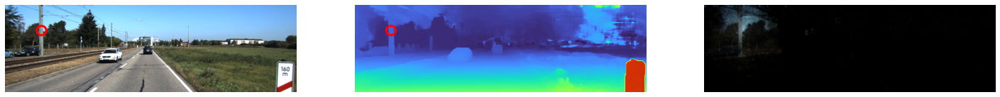

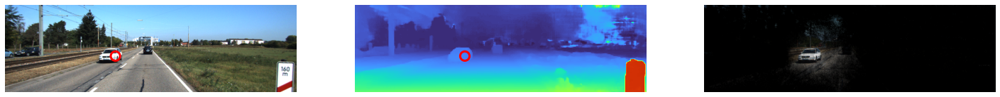

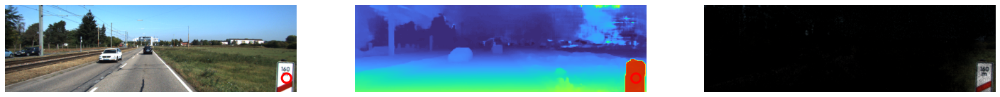

baseline


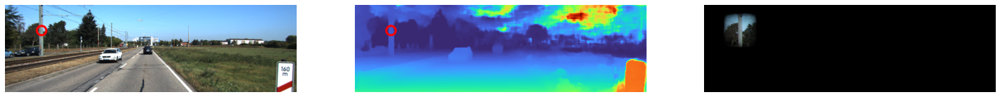

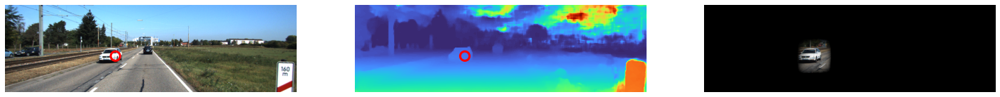

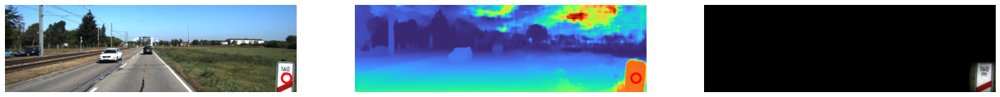

In [15]:
rois = [(110, 155), (220, 470), (315, 1200)]#[(190, 450), (190, 270), (210, 450), (160, 190), (225, 625), (190, 338)]
inds = [10,10,10]#[0, 1, 2, 5, 42, 42]
print('efficientnet-b3')
for i in range(len(inds)):
    show_saliency(model = model_finetuned, roi = rois[i], ind=inds[i])
print('baseline')
for i in range(len(inds)):
    show_saliency(model = model_finetuned_baseline, roi = rois[i], ind=inds[i])

In [16]:
def show_saliencies(model, rois, inds, dataset=validset):
    circles=[]
    stacks=[]
    colors=['r', 'y', 'b']
    for ind, roi, color in zip(inds,rois, colors):
        (img, img_r), target = dataset[ind]
        device = next(model.parameters()).device
        img_grad = img.clone().to(device)
        img_grad.requires_grad = True
        model.eval()
        img_grad_reshape, img_r = F.interpolate(img_grad.unsqueeze(0), size=(368,1248), mode='bicubic'), F.interpolate(img_r.to(device).unsqueeze(0), size=(368,1248), mode='bicubic')
        disp_out = model(img_grad_reshape, img_r)
        disp_out = F.interpolate(disp_out, size=tuple(target.shape[-2:]), mode='bicubic')
        disp_out *= target.shape[-1]/1248
        y, x = roi
        roi = disp_out[0,0,y,x]
        roi.backward()
        saliency = torch.mean(img_grad.grad.cpu().abs(), dim=0)
        model.train()

        circle1 = plt.Circle((x, y), 20, color=color, lw=3, fill=False)
        circles.append(circle1)

        saliency_sorted = np.sort(saliency.flatten())
        cut_ind = int(0.8 * len(saliency_sorted))
        cut_off = saliency_sorted[cut_ind]
        mask = saliency > cut_off
        saliency_masked = saliency.clone()
        saliency_masked = (saliency_masked - cut_off)/(saliency_masked.max()- cut_off)
        saliency_masked = torch.log(saliency_masked+1e-12-saliency_masked.min())
        saliency_masked[torch.logical_not(mask)] = 0.
        saliency_masked = (saliency_masked - saliency_masked.min())/(saliency_masked.max()- saliency_masked.min())
        saliency_masked[torch.logical_not(mask)] = 0.
        stacked_img = torch.cat([inv_normalize(img_grad.detach().cpu()), saliency_masked.unsqueeze(0)], 0)
        stacks.append(saliency_masked.unsqueeze(0))
    
    stacks = torch.cat(stacks)
    stacked_img = torch.amax(stacks,0)
    stacked_img = torch.cat([inv_normalize(img_grad.detach().cpu()), stacked_img.unsqueeze(0)], 0)
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16,10))
    show_image(inv_normalize(img_grad.detach().cpu()), ax1)
    for circle in circles:
        ax1.add_patch(circle)
    show_disparity(disp_out.detach().cpu(), ax2)
    ax2.imshow(torch.ones_like(saliency_masked), cmap='Greys_r') #alpha= 0 -> Transparent, 1 -> Fully Covering
    ax2.imshow(stacked_img.permute(1,2,0))
    ax2.set_title('Saliency Map')
    ax2.axis('off')
    ax1.set_title(None)
    ax2.set_title(None)
    plt.show()

efficientnet-b3


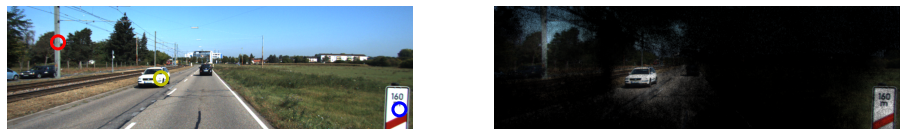

baseline model


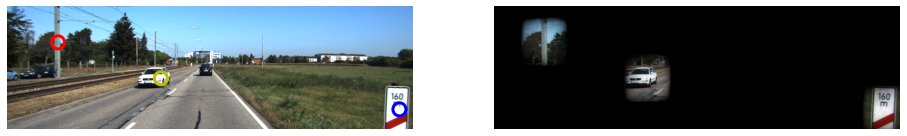

In [17]:
print('efficientnet-b3')
show_saliencies(model = model_finetuned, rois = rois, inds=inds)
print('baseline model')
show_saliencies(model = model_finetuned_baseline, rois = rois, inds=inds)

### Addendum 05.10.2021
#### Masking the sky

In [27]:
import segmentation_models_pytorch as smp
skynet = smp.Unet(
    encoder_name="timm-mobilenetv3_large_minimal_100",        
    encoder_weights="imagenet",    
    in_channels=3,                  
    classes=1
)
savepath = 'models/'+'sky_detection'+'_best.pt'
checkpoint = torch.load(savepath)
skynet.load_state_dict(checkpoint['model_state_dict'])
skynet.cuda()
skynet.eval()
model_finetuned.eval()
print()

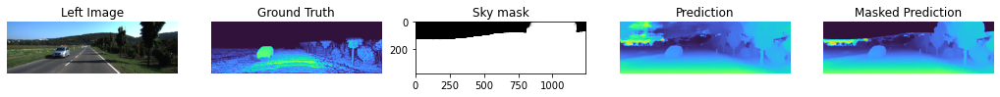

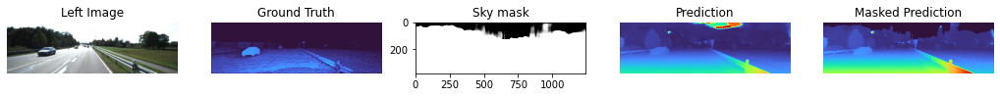

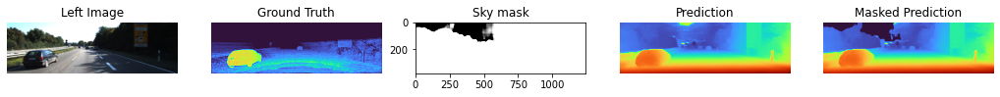

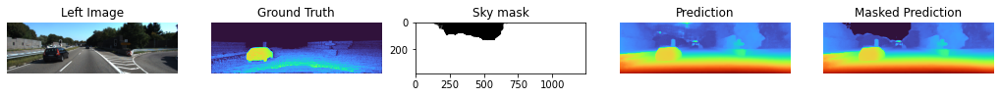

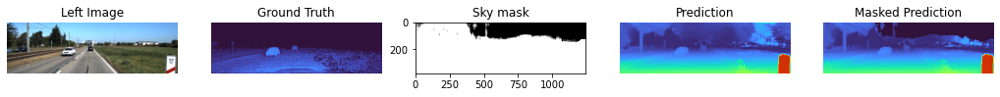

In [38]:
for i in [9, 5, 6, 1, 10]:
    (img_left, img_right), target = validset[i]
    with torch.no_grad():
        with autocast():
            img_left_interp, img_right_interp = F.interpolate(img_left.unsqueeze(0).cuda(), size=(368,1248), mode='bicubic'), F.interpolate(img_right.unsqueeze(0).cuda(), size=(368,1248), mode='bicubic')
            net_out = model_finetuned(img_left_interp, img_right_interp)
            net_out = F.interpolate(net_out, size=tuple(target.shape[-2:]), mode='bicubic')
            net_out *= target.shape[-1]/1248
            img_left_interp = F.interpolate(img_left.unsqueeze(0).cuda(), size=(384,1248), mode='bicubic')
            sky_mask = skynet(img_left_interp)
            sky_mask = F.interpolate(sky_mask, size=tuple(target.shape[-2:]), mode='bicubic')
            
    _, axes = plt.subplots(1, 5, figsize=(18, 7))
    show_image(inv_normalize(img_left), ax=axes[0], title='Left Image')

    show_disparity(target, ax=axes[1], title='Ground Truth')
    
    axes[2].imshow(sky_mask.squeeze().cpu().float(), cmap='Greys', vmin=0,vmax=1)
    axes[2].set_title('Sky mask')

    show_disparity(net_out.squeeze(0).cpu().float(), ax=axes[3], title='Prediction')
    net_out[sky_mask>0.8]=0
    show_disparity(net_out.squeeze(0).cpu().float(), ax=axes[4], title='Masked Prediction')

    plt.show()